# преобразования текста в фотореалистичное изображение

Репликация результатов StackGAN в Keras

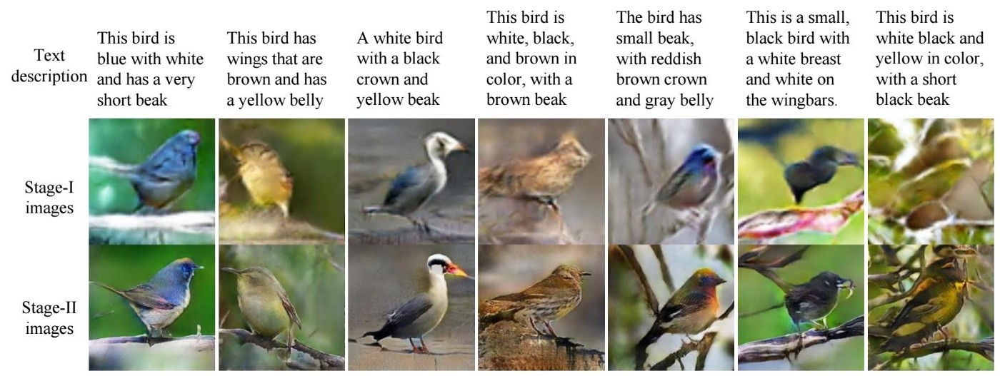

```
“Генеративные состязательные сети (GAN) — самая интересная идея за последние десять лет в области машинного обучения”. - Янн ЛеКун, директор Facebook AI
```

# 1. Введение

Во-первых, давайте просто сформулируем некоторые основные предварительные термины, которые помогут нам понять концепцию StackGAN.

```
Генеративные состязательные сети (GAN) состоят из двух моделей (генератора и дискриминатора),
которые альтернативно обучены конкурировать друг с другом.
Генератор генерирует новые экземпляры объекта, в то время как дискриминатор 
определяет, принадлежит ли новый экземпляр фактическому набору данных.
```

```
Условный GAN является расширением GAN, где и генератор, и дискриминатор 
получают дополнительные переменные c, 
что позволяет генератору генерировать изображения, обусловленные переменными c
```

# 2. StackGAN: преобразование текста в фотореалистичное изображение

Расмотрим задачу по разработке алгоритма для создания фотореалистичных изображений из заданного текста.

**Пример**:

`(Ввод текста): Птица черная с зеленым и имеет очень короткий клюв`

`(Сгенерированные на выходе фотореалистичные изображения)`:



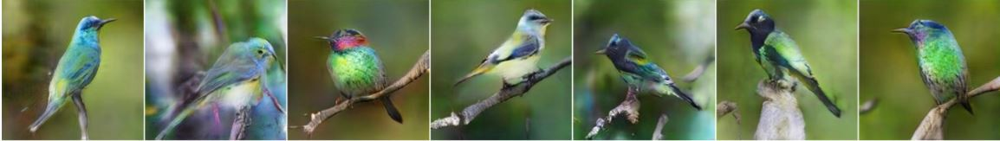

```
Вводимый текст: Птица черная с зеленым и имеет очень короткий клюв.
```

Приведенные выше изображения птиц не снимаются камерой, а создаются компьютером с использованием архитектуры глубокого обучения под названием StackGAN. StackGAN - это не первая попытка создания фотореалистичных изображений с использованием текста. Ранее предпринималось несколько попыток, но они не способны генерировать высококачественные изображения из текстового описания, и они не содержат необходимых деталей и ярких частей объекта. Stackgan (StackGAN) способен генерировать фотореалистичные изображения размером 256 × 256, основанные на текстовых описаниях.

Это поднимает несколько важных вопросов: “Почему StackGAN способен создавать такие объемные фотореалистичные изображения?”, “Чем отличается StackGAN?”

StackGAN разбивает сложную задачу на более управляемые подзадачи с помощью процесса уточнения эскиза. На этапе I GAN набрасывается примитивная форма и цвета объекта на основе заданного текстового описания, получая изображения с низким разрешением на этапе I. GAN II-го этапа принимает результаты первого этапа и текстовые описания в качестве входных данных и генерирует изображения с высоким разрешением с фотореалистичными деталями. Он способен исправлять дефекты в результатах этапа I и добавлять привлекательные детали в процессе уточнения.

# 3. Многоуровневые Порождающие Состязательные сети



Для создания изображений с высоким разрешением и фотореалистичными
деталями мы предлагаем простую, но эффективную многоуровневую генеративную состязательную сеть. Он разбивает процесс преобразования текста в изображение
на два этапа (см. Рис. 2).
- Этап I GAN: он набрасывает примитивную форму и основные цвета объекта, обусловленные заданным текстовым
описанием, и рисует макет фона из
случайного вектора шума, получая изображение с низким разрешением.
- GAN II стадии: исправляет дефекты в изображении с низким разрешением
изображение с этапа I и завершает детализацию объекта
путем повторного чтения текстового описания, создавая фотореалистичное изображение с высоким разрешением.



## 3.1. Предварительные условия

Генеративные состязательные сети (GAN) состоят из двух моделей, которые поочередно обучаются конкурировать друг с другом. Генератор G оптимизирован для воспроизведения истинных pdata распределения данных путем генерации изображений, которые дискриминатору D трудно отличить
от реальных изображений. Между тем, D оптимизирован для различения
реальных изображений и синтетических изображений, сгенерированных G. В целом,
процедура обучения аналогична игре min-max для двух игроков
игра со следующей целевой функцией,

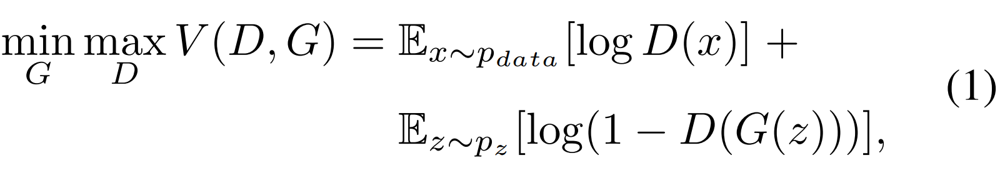

где *x* - реальное изображение из истинных данных 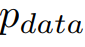,
а *z* - вектор шума, выбранный из распределения pz (например,
равномерное или гауссово распределение).
Условный GAN  является расширением GAN, где
и генератор, и дискриминатор получают дополнительные переменные условия *c*, что приводит к *G(z, c)* и *D(x, c)*. Эта
формулировка позволяет *G* генерировать изображения, обусловленные
переменными *c*.

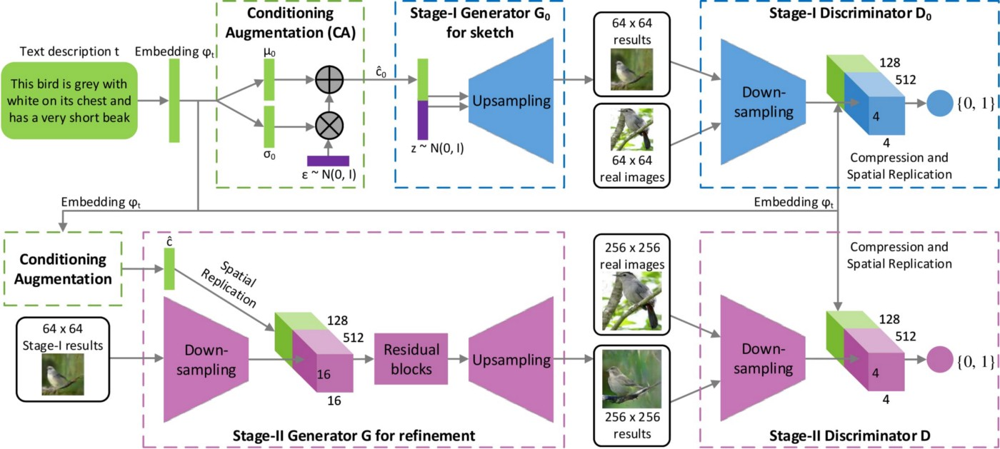

`рис. 2`

## 3.2. Усиление аугментации

Как показано на рис. 2, текстовое описание t сначала кодируется кодером, что приводит к текстовому встраиванию ϕt. В
предыдущих работах [26, 24] вложение текста нелинейно
преобразуется для генерации обусловливающих скрытых переменных в качестве
входных данных генератора. Однако скрытое пространство для
встраивания текста обычно имеет большие размеры (> 100 измерений). При ограниченном объеме данных это обычно приводит к разрыву в скрытом многообразии данных, что нежелательно
для обучения генератора. Чтобы смягчить эту проблему, мы
внедрите метод усиления аугментации для получения дополнительных переменных аугментации 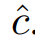. В отличие от
фиксированной условной текстовой переменной c , мы произвольно
выбираем скрытые переменные 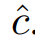 из независимого гауссова
распределения N (µ(ϕt), Σ(ϕt))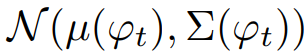, где среднее значение µ(ϕt) и
диагональная ковариационная матрица Σ(ϕt) являются функциями
встраивание текста ϕt. Предлагаемое дополнение к кондиционированию
дает больше обучающих пар при небольшом количестве пар imagetext и, таким образом, повышает устойчивость к небольшим возмущениям вдоль коллектора кондиционирования. Для дальнейшего обеспечения соблюдения
гладкость по кондиционирующему коллектору и избежать
переобучения, мы добавляем следующий член регуляризации
к цели генератора во время обучения,

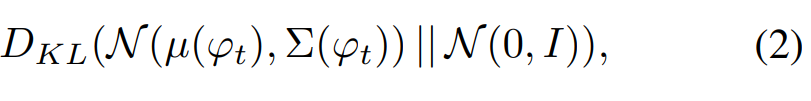

которая является дивергенцией Кулбека-Лейблера (KL divergence)
между стандартным распределением Гаусса и условным распределением Гаусса. Случайность, введенная
в дополнение к условию, полезна для моделирования перевода текста в изображение, поскольку одно и то же предложение обычно
соответствует объектам с различными позами и внешним видом.

### 3.3. Stage-I GAN

Вместо непосредственного создания изображения с высоким разрешением
, обусловленного текстовым описанием, мы упрощаем задачу
, сначала создавая изображение с низким разрешением с помощью нашего Stage-I GAN,
который фокусируется на рисовании только приблизительной формы и правильных цветов для объекта.
Пусть $ϕ_t$ - текстовое вложение данного описания,
которое генерируется предварительно обученным кодировщиком. Переменные гауссова условия cˆ0 для встраивания текста выбираются из image.png для захвата
значение $ϕ_t$ с вариациями.Обусловленный $cˆ_0$ и случайной величиной z, этап I GAN обучает дискриминатор $D_0$
и генератор $G_0$, альтернативно максимизируя 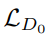
в
уравнении (3) и минимизируя 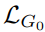
в уравнении (4),

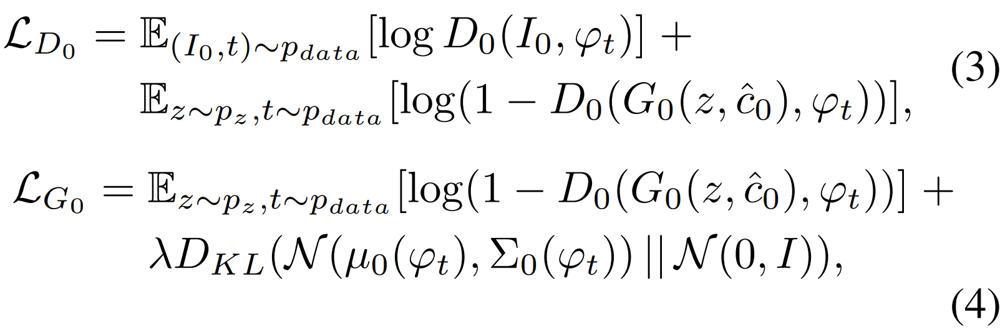

где реальное изображение $I_0$ и текстовое описание t взяты из
истинных данных распределения данных. z - вектор шума, случайно
выбранный из заданного распределения pz (гауссово распределение
в этой статье). λ - это параметр регуляризации, который уравновешивает
два члена в уравнении (4). Мы устанавливаем λ = 1 для всех наших экспериментов.Используя трюк репараметризации, как $µ_0$($ϕ_t$), так и $Σ_0$($ϕ_t$) изучаются совместно с
остальной частью сети.

### **Архитектура модели.**

 Для генератора $G_0$, чтобы получить
переменную формирования текста 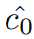, текстовое вложение $ϕ_t$ сначала подается в полностью связанный слой для генерации $µ_0$ и $σ_0$ ($σ_0$
- значения в диагонали $Σ_0$) для распределения Гаусса 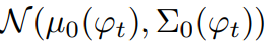. затем 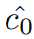 отбираются из
распределения Гаусса. Наш многомерный
вектор обусловленности c00 вычисляется по формуле 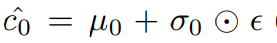(где image.png -
поэлементное умножение,image.png ∼ N (0, I)). Затем 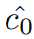
объединяется с многомерным вектором шума для генерации изображения $W_0$ × $H_0$ с помощью серии блоков с повышающей дискретизацией.


Для дискриминатора $D_0$ текстовое вложение $ϕ_t$ сначала
сжимается до размеров Nd с использованием полностью связанного слоя
, а затем пространственно реплицируется для формирования тензора $M_d$ × $M_d$ × $N_d$. Тем временем изображение проходит через серию
блоков с понижающей дискретизацией до тех пор, пока оно не получит пространственный размер $M_d$ × $M_d$. Затем карта фильтра изображения объединяется по размеру
канала с тензором текста. Полученный тензор далее подается на сверточный слой размером 1 × 1 для совместного
изучения объектов на изображении и в тексте. Наконец, для получения оценки решения используется полностью связанный слой с одним узлом.

## 3.4. Stage-II GAN

На изображениях с низким разрешением, созданных Stage-I, обычно отсутствуют яркие части объекта и могут присутствовать искажения формы. Некоторые детали в тексте также могут быть опущены на
первом этапе, что жизненно важно для создания фотореалистичных изображений. Наш  Stage-II GAN построен на основе результатов Stage-IGAN
для получения изображений с высоким разрешением. Это обусловлено использованием изображений с
низким разрешением, а также повторным внедрением текста для
исправления дефектов в результатах этапа I. На втором этапе GAN дополняет ранее игнорируемую текстовую информацию для создания более
фотореалистичных деталей.

Обусловленность результатов с низким разрешением $s_0$ =
$G_0$(z, c$ˆ_0$) и гауссовы скрытые переменные Cˆ, дискриминатор
D и генератор G на этапе Stage-II GAN обучаются путем альтернативного увеличения $L_D$ в уравнение (5) и сведение к минимуму $L_G$ в
Уравнение (6),

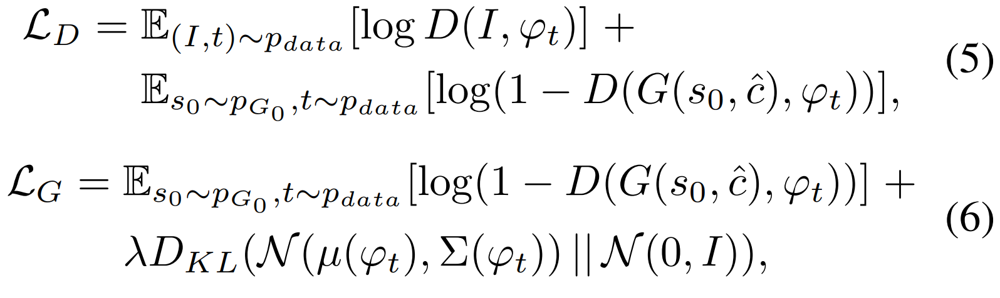

В отличие от оригинальной формулировки GAN, случайный
шум z на этом этапе не используется в предположении, что
случайность уже сохранена $s_0$. Переменные гауссова обусловливания Cˆ, используемые на этом этапе, и c$ˆ_0$, используемые
на Stage-I GAN, могут совместно использовать один и тот же предварительно обученный кодировщик текста,
генерируя один и тот же текст, встраивая $ϕ_t$.Тем не менее, StageI и Stage-II условия аугментации имеют разные
полностью связанные слои для генерации различных средних и
стандартных отклонений. Таким образом, Stage-II GAN учится
фиксировать полезную информацию в текстовом встраивании, которая
опущена в Stage-I GAN

### **Архитектура модели.**

Мы проектируем генератор Stage-II как
сеть кодер-декодер с остаточными блоками. Аналогично предыдущему этапу, встраивание текста ϕt используется
для генерации $N_g$-мерного вектора формирования текста Cˆ,
который пространственно реплицируется для формирования тензора $M_g$×$M_g$×$N_g$.
Тем временем результат $s_0$ Stage-I, сгенерированный Stage-I GAN
, подается в несколько блоков понижающей выборки (т.е. в кодер) до тех пор, пока он не будет иметь пространственный размер $M_g$ × $M_g$. Объекты изображения
и текстовые объекты объединяются по размеру канала. Закодированное изображение содержит элементы в сочетании с текстом
объекты загружаются в несколько остаточных блоков, которые предназначены для изучения мультимодальных представлений графических
и текстовых объектов. Наконец,
для получения изображения с высоким разрешением W ×H используется ряд слоев с повышающей дискретизацией (т.е. декодер)
. Такой генератор способен помочь устранить дефекты во
входном изображении, одновременно добавляя больше деталей для создания реалистичного
изображения с высоким разрешением.

Что касается дискриминатора, то его структура аналогична
структуре дискриминатора этапа I только с дополнительными блоками понижающей выборки
так как на этом этапе размер изображения больше. Чтобы явно применить GAN для изучения лучшего выравнивания между изображением и
обусловливающим текстом, вместо использования ванильного дискриминатора, мы используем дискриминатор с учетом соответствия для обоих этапов. Во время обучения
дискриминатор принимает реальные изображения и соответствующие им текстовые
описания в качестве пар положительных выборок, тогда как пары отрицательных выборок состоят из двух групп. Первый - это реальные изображения с
несовпадающими текстовыми вложениями, а второй - синтетические
изображения с соответствующими текстовыми вложениями.

## 3.5. Детали реализации

Блоки повышающей выборки состоят из повышающей выборки ближайшего соседа
, за которой следует свертка 3×3 шага 1. Пакетная
нормализация и повторная активация применяются после
каждой свертки, кроме последней. Остаточные блоки
состоят из свертки 3×3 шага 1, пакетной нормализации
и повторной обработки. Два остаточных блока используются в моделях StackGAN размером 128×128, в то время как четыре используются в моделях 256×256. Блоки
понижающей выборки состоят из свертки 4 × 4 шага 2,
пакетной нормализации и LeakyReLU, за исключением того, что первый
не имеет пакетной нормализации.
По умолчанию $N_g$ = 128, $N_z$ = 100, $M_g$ = 16, $M_d$ = 4,
$N_d$ = 128, $W_0$ = H0 = 64 и W = H = 256. Для обучения мы сначала итеративно обучаем $D_0$ и $G_0$ GAN I стадии
в течение 600 эпох, фиксируя GAN II стадии. Затем мы итеративно
обучаем D и G GAN II стадии еще на 600 эпох,
фиксируя GAN I стадии. Все сети обучаются с использованием ADAM
решатель с размером пакета 64 и начальной скоростью обучения
0,0002. Скорость обучения уменьшается до 1/2 от ее предыдущего
значения каждые 100 эпох.

# Результаты исследовательской работы StackGAN

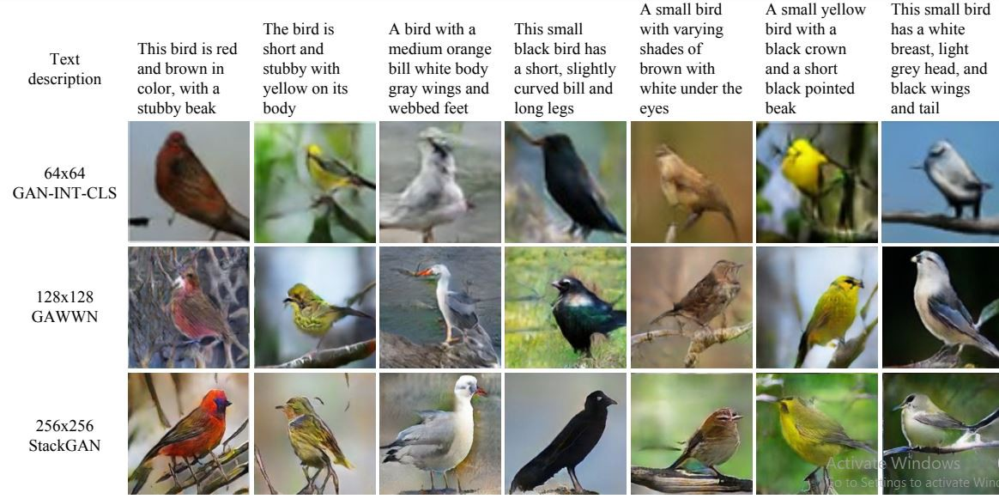

Пример результатов наших StackGAN, GAWWN и GAN-INT-CLS, основанных на текстовых описаниях из набора тестов CUB

# DALL·E от OpenAI

Исследователи в области искусственного интеллекта из OpenAI создали нейронную сеть под названием DALL·E, которая генерирует изображения из текстового описания на естественном языке.

DALL·E представляет собой версию GPT-3 с 12 миллиардами параметров, обученную генерировать изображения из текстовых описаний на датасете из пар текст-изображение. Исследователи обнаружили, что DALL·E обладает огромным репертуаром генеративных возможностей, включая возможность создания антропоморфных животных и других необычных объектов, комбинирующих совершенно нетривиальные свойства, например "кресло в форме авокадо."

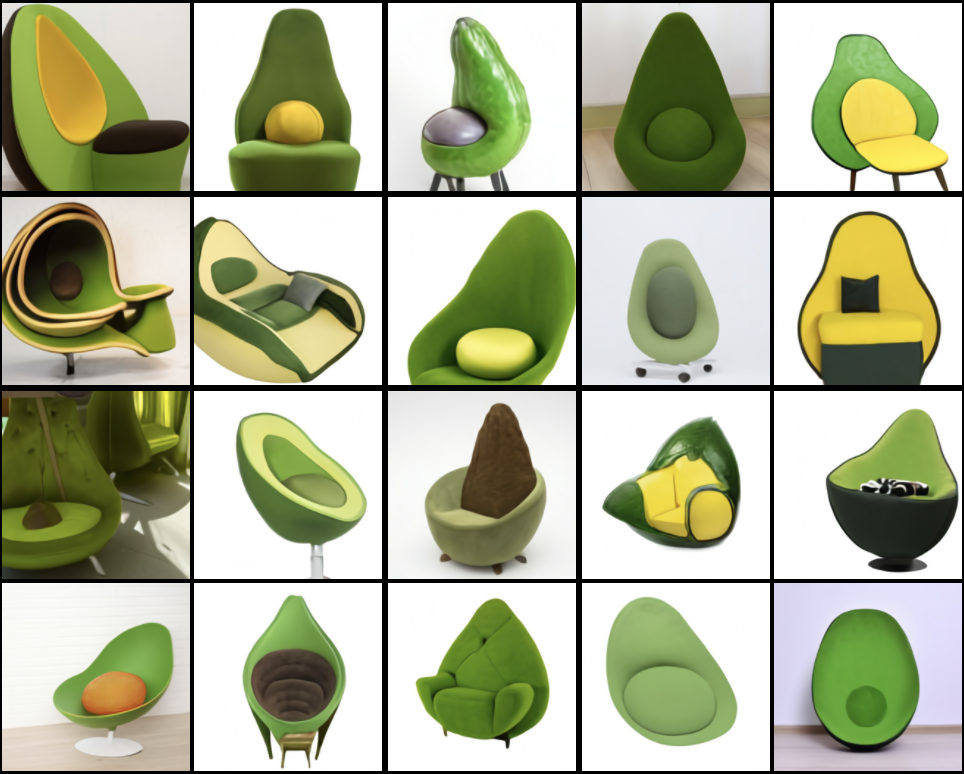

`Изображения, сгенерированные DALL·E на основании текстового описания "кресло в форме авокадо"`

Можно сказать, что уже были все предпосылки к созданию DALL·E: прошлогодний триумф GPT-3 и успешное создание Image GPT сети, способной к генерации изображений на основе текста, использующей языковую модель трансформер GPT-2. Все уже подходило к тому, чтобы создать новую модель, взяв в этот раз за основу GPT-3. И теперь DALL·E показывает невиданные доселе чудеса манипулирования визуальными концепциями с помощью естественного языка!

Как и GPT-3, DALL·E — это языковая модель-трансформер, принимающая на вход текст и изображение, как последовательность размером до 1280 токенов. Модель обучена максимизировать правдоподобие при генерации токенов, следующих один за другим.

Также, сотрудники из openai выразили озадаченность тем, что уровень реалистичности и результаты работы современных генеративных моделей могут оказать сильное влияние на общество. И опасаются за возможные неоднозначные социальные и экономические последствия использования подобных технологий.

Давайте посмотрим на примеры, которые говорят сами за себя. Исследователи утверждают, что не использовали ручной "cherry picking". Примерами являются изображения, полученные при помощи DALL·E, в которых используются 32 лучших примера из 512-ти сгенерированных, отобранных нейросетью нейронного ранжирования CLIP, созданную теми же OpenAI.

Text: **a collection of glasses sitting on the table**

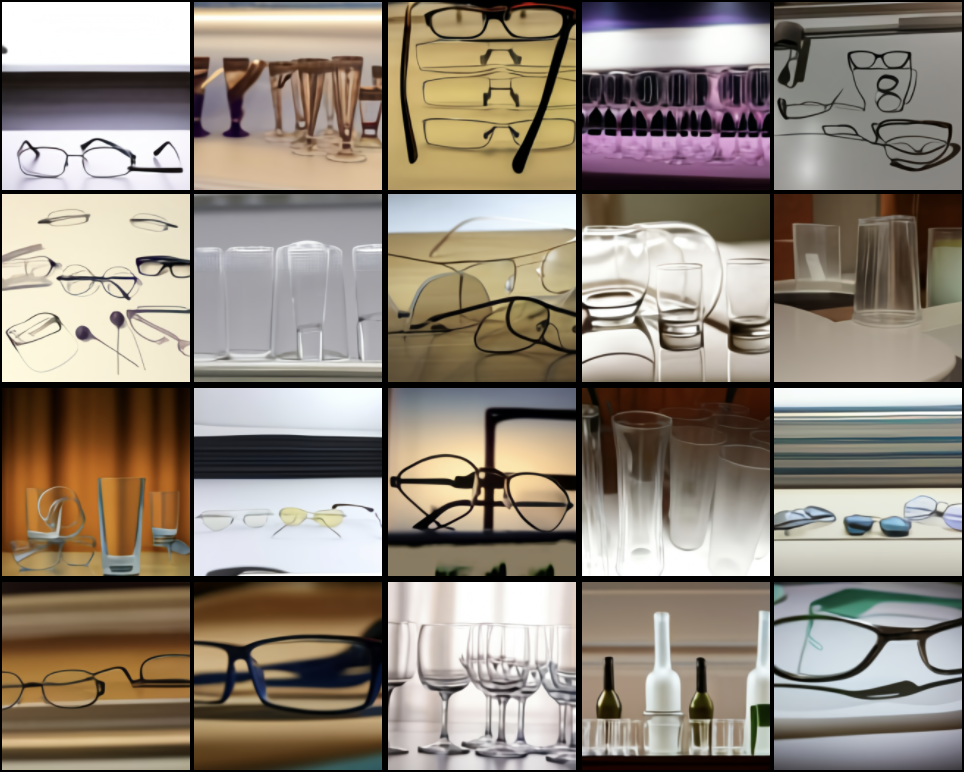

`Изображения, сгенерированные DALL·E`

Забавно, что алгоритм способен к мультимодальности, и справляется с неоднозначностью слова **glasses** в английском языке.

Text: **an emoji of a baby penguin wearing a blue hat, red gloves, green shirt, and yellow pants**

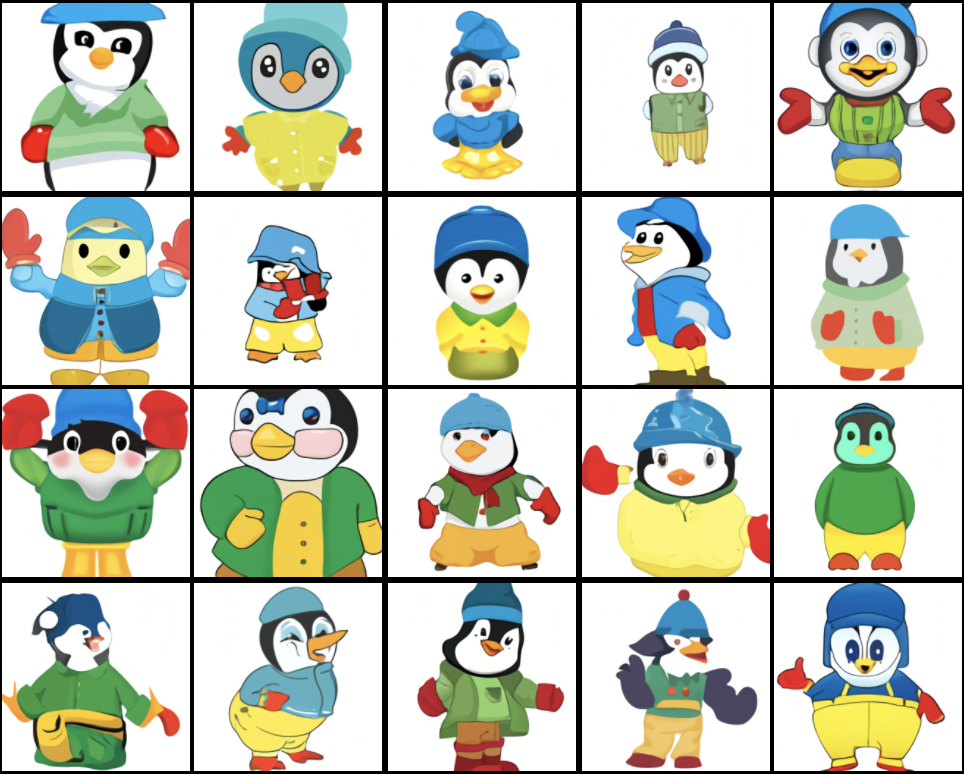

`Эмодзи пингвиненка, одетого в голубую шапку, красные перчатки, зеленую футболку и желтые штаны `

DALL·E может не только генерировать изображение с нуля, но и регенерировать (достраивать) любую прямоугольную область существующего изображения, вплоть до нижнего правого угла изображения, в соответствии с текстовым описанием. В качестве примера за основу взяли верхнюю часть фотографии бюста Гомера. Модель принимает на вход это изображение и текст: **a photograph of a bust of homer**

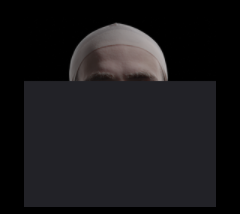

Text: **a photograph of a bust of homer**

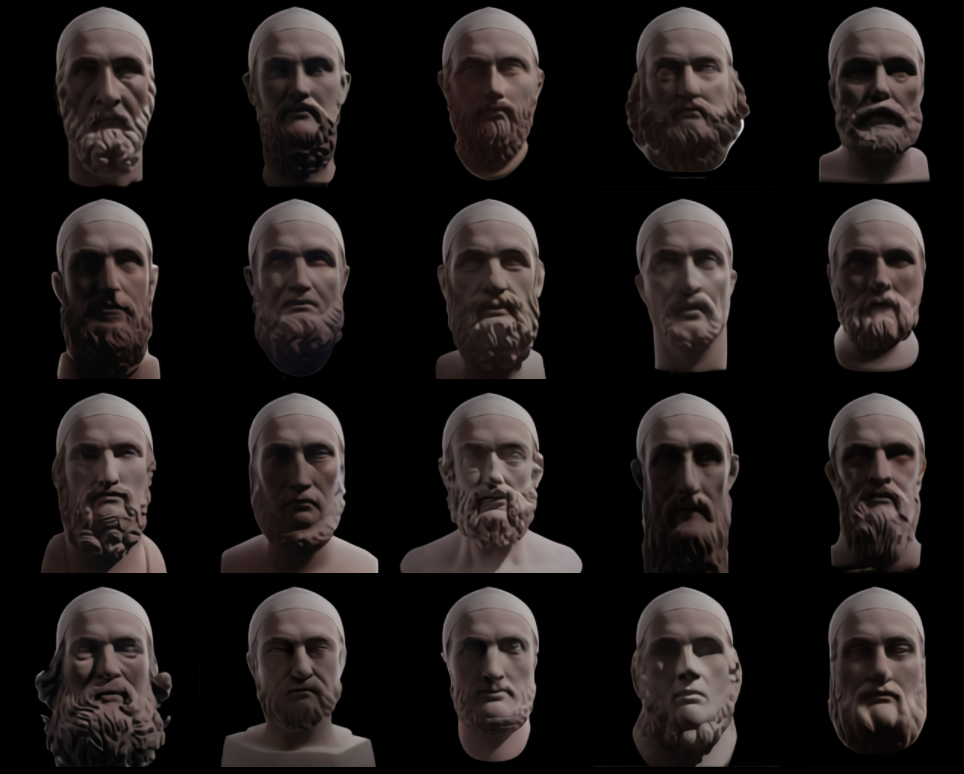

`Фотография бюста Гомера`

Особенно поражает то, что DALL·E выучил исторический и географический контекст. Модель способна к обобщению тенденций в дизайне и технологиях. Вот пример того, как DALL·E генерирует телефонные аппараты разных десятилетий двадцатого века.

Text: **a photo of phone from the ...**

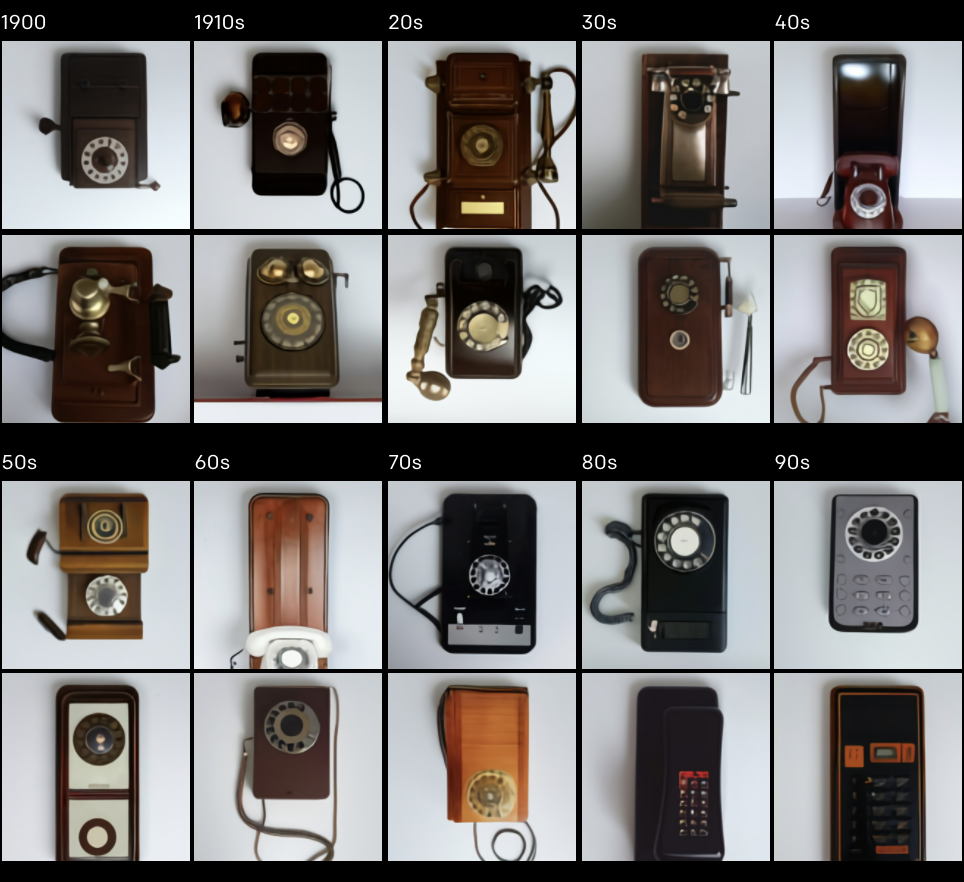

`Фотографии телефонов разных десятилетий XX века`


DALL·E попросили сгенерировать изображение по следующему описанию: **"гостиная с двумя белыми креслами и картиной Колизея, картина установлена ​​над современным камином"**. Как оказалось DALL·E может создавать картины на самые разные темы, включая реальные локации, такие как «Колизей», и вымышленных персонажей, таких как «йода». Для каждого объекта DALL·E предлагает множество вариантов. В то время как картина почти всегда присутствует на изображении, DALL·E иногда не может нарисовать камин или правильное количество кресел.

Text: **a living room with two white armchairs and painting of the colosseum. the painting is mounted above a modern fireplace**

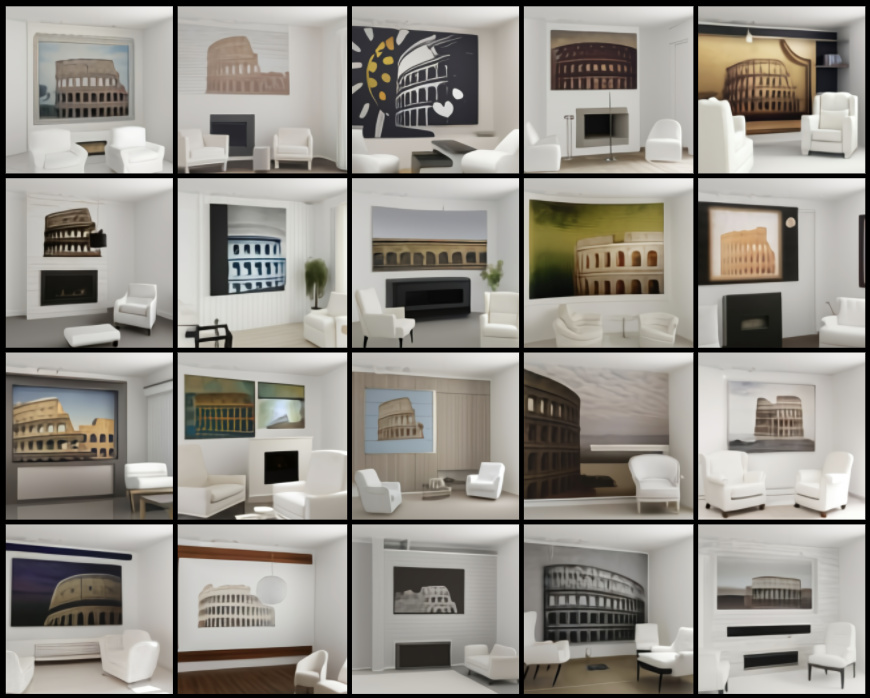

`Гостиная с двумя белыми креслами и картиной Колизея, висящей ​​над современным камином`

*Название модели DALL·E (DALL-E, DALL E) является словослиянием имени художника Сальвадора Дали и робота WALL·E от Pixar. Вышел такой своеобразный Вали-Дали. Вообще в мире ИИ "придумывание" таких оригинальных названий — это некий тренд. Что определенно радует, и делает эту область еще более оригинальной.*

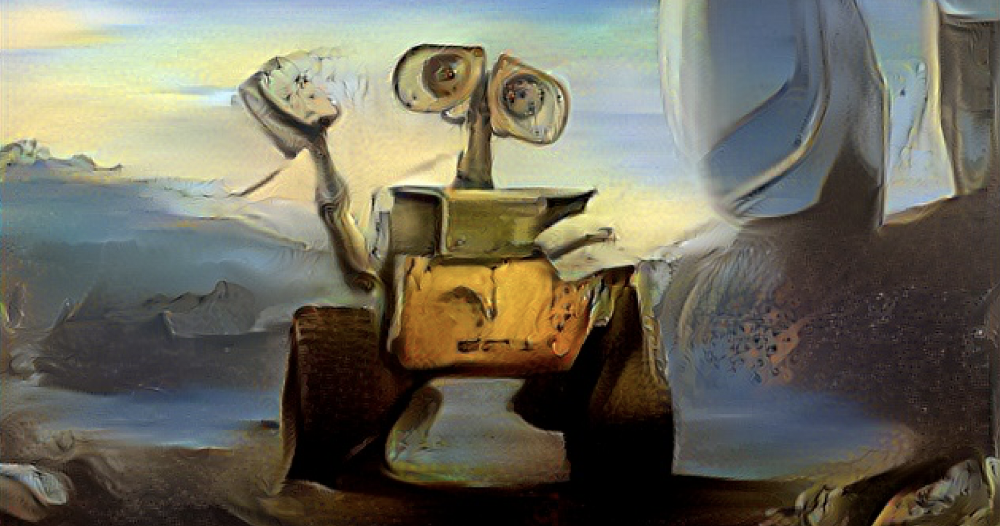

`Старый добрый перенос стиля WALL · E  в Dalí`



Для пущего сюрреализма и оправдания своего названия DALL·E "попросили" сгенерировать животных, синтезированных из множества понятий, включая музыкальные инструменты, продукты питания и предметы домашнего обихода. Хотя это не всегда удавалось, исследователи обнаруживали, что DALL·E иногда принимает во внимание формы двух объектов при решении о том, как их объединить. Например, когда предлагается нарисовать «улитку-арфу».

Text: **a snail made of harp**

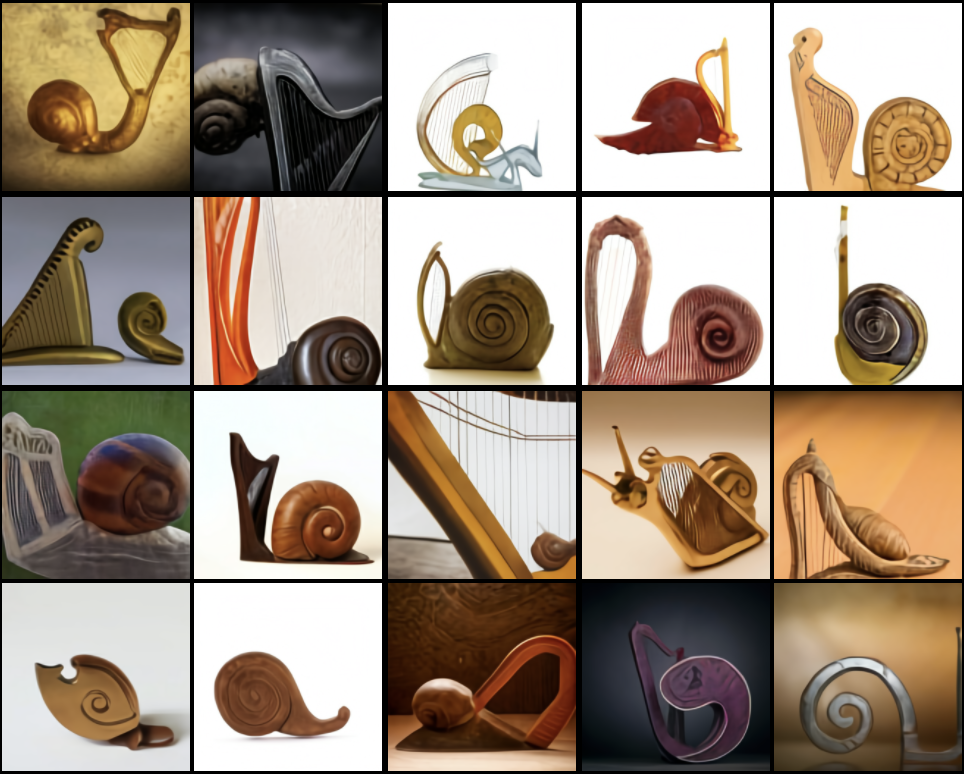

`Улитка-Арфа. Фантастические твари и где они обитают..`

## **Вывод**



DALL·E — это декодер-трансформер, который принимает и текст, и изображение в виде единой последовательности токенов (1280 токенов = 256 для текста + 1024 для изображения) и далее генерирует изображения авторегрессивном режиме. По-видимому, авторегрессивный режим работы трансформера создает дискретную репрезентацию в разрешении 32х32, после чего VQVAE предобученный энкодер-декодер "завершает генерацию" до разрешения 256x256. Оговорюсь, что последнее предложение — это мое предположение, нужно подождать выхода самого пейпера.

Что можно сказать? Наступает эра "великого объединения" языковых моделей, компьютерного зрения и генеративных сетей. То что мы видим сейчас, уже поражает воображение своими результатами, не говоря уже о том, насколько подобные подходы могут изменить процесс генерации контента.

Как будет возможность, подготовлю уже технический разбор самой модели DALL·E, учитывая, что ребята из openai обещают предоставить более подробную информацию об архитектуре и обучении модели в ближайшее время.